In [22]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import yfinance as yf
import pandas_ta as ta

from sklearn.preprocessing import MinMaxScaler

from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dropout
from keras.layers import Dense
from keras.layers import TimeDistributed

import tensorflow as tf
import keras
from keras import optimizers
from keras.callbacks import History
from keras.models import Model
from keras.layers import Dense, Dropout, LSTM, Input, Activation, concatenate

plt.style.use('https://github.com/dhaitz/matplotlib-stylesheets/raw/master/pitayasmoothie-dark.mplstyle')

data = yf.download(tickers = 'AAPL', start = '2012-03-11',end = '2022-07-10')
data.head(10)

[*********************100%%**********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2020-01-02,74.059998,75.150002,73.797501,75.087502,73.152649,135480400
2020-01-03,74.287498,75.144997,74.125000,74.357498,72.441467,146322800
2020-01-06,73.447502,74.989998,73.187500,74.949997,73.018692,118387200
2020-01-07,74.959999,75.224998,74.370003,74.597504,72.675262,108872000
2020-01-08,74.290001,76.110001,74.290001,75.797501,73.844353,132079200
2020-01-09,76.809998,77.607498,76.550003,77.407501,75.412872,170108400
2020-01-10,77.650002,78.167503,77.062500,77.582497,75.583359,140644800
2020-01-13,77.910004,79.267502,77.787498,79.239998,77.198143,121532000
2020-01-14,79.175003,79.392502,78.042503,78.169998,76.155701,161954400


In [23]:
# Adding indicators
data['RSI']=ta.rsi(data.Close, length=15)
data['EMAF']=ta.ema(data.Close, length=20)
data['EMAM']=ta.ema(data.Close, length=100)
data['EMAS']=ta.ema(data.Close, length=150)

data['Target'] = data['Adj Close']-data.Open
data['Target'] = data['Target'].shift(-1)

data['TargetClass'] = [1 if data.Target[i]>0 else 0 for i in range(len(data))]

data['TargetNextClose'] = data['Adj Close'].shift(-1)

data.dropna(inplace=True)
data.reset_index(inplace = True)
data.drop(['Volume', 'Close', 'Date'], axis=1, inplace=True)
data.head(10)

C:\Users\dasan\AppData\Local\Temp\ipykernel_12024\2155757146.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  data['TargetClass'] = [1 if data.Target[i]>0 else 0 for i in range(len(data))]


,Open,High,Low,Adj Close,RSI,EMAF,EMAM,EMAS,Target,TargetClass,TargetNextClose


In [15]:
data_set = data.iloc[:, 0:11]#.values
pd.set_option('display.max_columns', None)

data_set.head(20)
#print(data_set.shape)
#print(data.shape)
#print(type(data_set))

,Open,High,Low,Adj Close,RSI,EMAF,EMAM,EMAS,Target,TargetClass,TargetNextClose


In [4]:
#Target column Categories
#y =[1 if data.Open[i]>data.Close[i] else 0 for i in range(0, len(data))]
#yi = [data.Open[i]-data.Close[i] for i in range(0, len(data))]
#print(yi)
#print(len(yi))

In [9]:
#Scaling
sc = MinMaxScaler(feature_range=(0,1))
data_set_scaled = sc.fit_transform(data_set)
print(data_set_scaled)

[[0.05470759 0.05242742 0.05248086 ... 0.32424719 0.         0.04256072]
 [0.05112291 0.04992461 0.05187615 ... 0.32731653 0.         0.04347486]
 [0.0517133  0.04987168 0.05156299 ... 0.34720006 0.         0.04619567]
 ...
 [0.73420066 0.75496323 0.7448696  ... 0.53393819 1.         0.7721997 ]
 [0.75541247 0.76984446 0.76996544 ... 0.61712356 1.         0.79244647]
 [0.76690706 0.78425145 0.78326921 ... 0.54388522 1.         0.79651935]]


In [12]:
# multiple feature from data provided to the model
X = []
#print(data_set_scaled[0].size)
#data_set_scaled=data_set.values
backcandles = 50
print(data_set_scaled.shape[0])
for j in range(8):#data_set_scaled[0].size):#2 columns are target not X
    X.append([])
    for i in range(backcandles, data_set_scaled.shape[0]):#backcandles+2
        X[j].append(data_set_scaled[i-backcandles:i, j])

#move axis from 0 to position 2
print(X)
X=np.moveaxis(X, [0], [2])
print(X)

#Erase first elements of y because of backcandles to match X length
#del(yi[0:backcandles])
#X, yi = np.array(X), np.array(yi)
# Choose -1 for last column, classification else -2...
X, yi =np.array(X), np.array(data_set_scaled[backcandles:,-1])
y=np.reshape(yi,(len(yi),1))
#y=sc.fit_transform(yi)
#X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
print(X)
print(X.shape)
print(y)
print(y.shape)

2449
[[array([0.05470759, 0.05112291, 0.0517133 , 0.05235236, 0.0552091 ,
       0.05324536, 0.05143821, 0.04749591, 0.05142762, 0.04940464,
       0.04909991, 0.04686319, 0.04378427, 0.04449104, 0.04399799,
       0.04138038, 0.04280028, 0.03933199, 0.03653661, 0.03225998,
       0.03516538, 0.03194045, 0.03333496, 0.03164842, 0.02903927,
       0.03232134, 0.03892358, 0.03730265, 0.03792055, 0.03976791,
       0.04265638, 0.04005781, 0.04279817, 0.04207234, 0.04352399,
       0.0410164 , 0.03828875, 0.02983069, 0.03500668, 0.02899695,
       0.03212243, 0.0338153 , 0.03029835, 0.02682794, 0.02559637,
       0.02899695, 0.03036606, 0.030055  , 0.02634547, 0.02801296]), array([0.05112291, 0.0517133 , 0.05235236, 0.0552091 , 0.05324536,
       0.05143821, 0.04749591, 0.05142762, 0.04940464, 0.04909991,
       0.04686319, 0.04378427, 0.04449104, 0.04399799, 0.04138038,
       0.04280028, 0.03933199, 0.03653661, 0.03225998, 0.03516538,
       0.03194045, 0.03333496, 0.03164842, 0.02903927

In [7]:
#also comprehensions for X
#X = np.array([data_set_scaled[i-backcandles:i,:4].copy() for i in range(backcandles,len(data_set_scaled))])
#print(X)
#print(X.shape)

In [8]:
# split data into train test sets
splitlimit = int(len(X)*0.7)
print(splitlimit)
X_train, X_test = X[:splitlimit], X[splitlimit:]
y_train, y_test = y[:splitlimit], y[splitlimit:]

print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)
print(y_train)

1679
(1679, 50, 8)
(720, 50, 8)
(1679, 1)
(720, 1)
[[0.02223206]
 [0.0212373 ]
 [0.02534355]
 ...
 [0.22710802]
 [0.22373934]
 [0.22572002]]


In [9]:
#tf.random.set_seed(20)
np.random.seed(10)

lstm_input = Input(shape=(backcandles, 8), name='lstm_input')
inputs = LSTM(150, name='first_layer')(lstm_input)
inputs = Dense(1, name='dense_layer')(inputs)
output = Activation('linear', name='output')(inputs)
model = Model(inputs=lstm_input, outputs=output)
adam = optimizers.Adam()
model.compile(optimizer=adam, loss='mse')
model.fit(x=X_train, y=y_train, batch_size=15, epochs=30, shuffle=True, validation_split = 0.1)


Epoch 1/30

101/101 [==============================] - 9s 43ms/step - loss: 7.3672e-04 - val_loss: 8.0084e-05
Epoch 2/30
101/101 [==============================] - 3s 32ms/step - loss: 3.3812e-05 - val_loss: 6.8943e-05
Epoch 3/30
101/101 [==============================] - 3s 31ms/step - loss: 2.8888e-05 - val_loss: 5.6920e-05
Epoch 4/30
101/101 [==============================] - 3s 31ms/step - loss: 2.7190e-05 - val_loss: 7.2083e-05
Epoch 5/30
101/101 [==============================] - 3s 32ms/step - loss: 2.8012e-05 - val_loss: 6.3920e-05
Epoch 6/30
101/101 [==============================] - 3s 32ms/step - loss: 2.6403e-05 - val_loss: 5.9900e-05
Epoch 7/30
101/101 [==============================] - 3s 32ms/step - loss: 2.8460e-05 - val_loss: 5.1082e-05
Epoch 8/30
101/101 [==============================] - 3s 32ms/step - loss: 2.5844e-05 - val_loss: 8.4388e-05
Epoch 9/30
101/101 [==============================] - 3s 32ms/step - loss: 2.4880e-05 - val_loss: 5.8417e-05
Epoch 10/30
101/1

In [10]:
y_pred = model.predict(X_test)
#y_pred=np.where(y_pred > 0.43, 1,0)
for i in range(10):
    print(y_pred[i], y_test[i])

23/23 [==============================] - 1s 16ms/step
[0.22061126] [0.23075137]
[0.22067901] [0.23036101]
[0.22385521] [0.22596579]
[0.22490185] [0.23101161]
[0.22208081] [0.23692488]
[0.22439338] [0.23689594]
[0.22889589] [0.23821161]
[0.2307986] [0.24186942]
[0.23241083] [0.25183096]
[0.23479992] [0.25110804]


c:\Users\dasan\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


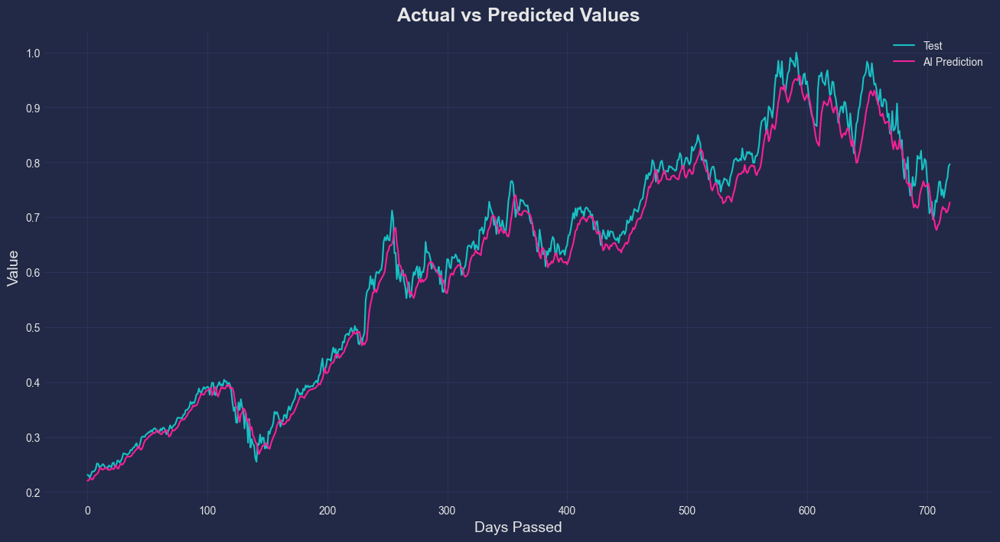

In [11]:
from keras.models import load_model

model.save('StockAI.h5')

plt.figure(figsize=(16,8))
plt.plot(y_test, label = 'Test')
plt.plot(y_pred, label = 'AI Prediction')

plt.legend()
title_font = {'fontweight': 'bold', 'fontsize': 18, 'verticalalignment': 'bottom'}
axis_label_font = {'fontsize': 14}

plt.title('Actual vs Predicted Values', fontdict=title_font)
plt.xlabel('Days Passed', fontdict=axis_label_font)
plt.ylabel('Value', fontdict=axis_label_font)



plt.show()
